In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, KFold, RandomizedSearchCV, train_test_split
from sklearn.feature_selection import f_classif, SelectKBest, RFE
from imblearn.over_sampling import SMOTENC
from xgboost import XGBClassifier
from scipy.stats import randint, uniform

# Using bio-signals to predict smoking status

Steps:

1.   Exploratory Data Analysis
2.   Classification imbalance
3.   Feature selection
4.   Supervised learning
5.   Semi-supervised learning
6.   Unsupervised learning









In [2]:
### loading data
train_df = pd.read_csv('/content/train_dataset.csv')
print(train_df.head())

   age  height(cm)  weight(kg)  waist(cm)  eyesight(left)  eyesight(right)  \
0   35         170          85       97.0             0.9              0.9   
1   20         175         110      110.0             0.7              0.9   
2   45         155          65       86.0             0.9              0.9   
3   45         165          80       94.0             0.8              0.7   
4   20         165          60       81.0             1.5              0.1   

   hearing(left)  hearing(right)  systolic  relaxation  ...  HDL  LDL  \
0              1               1       118          78  ...   70  142   
1              1               1       119          79  ...   71  114   
2              1               1       110          80  ...   57  112   
3              1               1       158          88  ...   46   91   
4              1               1       109          64  ...   47   92   

   hemoglobin  Urine protein  serum creatinine   AST   ALT  Gtp  \
0        19.8            

In [3]:
train_df.describe()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
count,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,...,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000
mean,44.127591,164.689488,65.938718,82.062115,1.014955,1.008768,1.025369,1.026190,121.475631,75.994408,...,57.293146,115.081495,14.624264,1.086523,0.886030,26.198235,27.145188,39.905038,0.214421,0.367279
std,12.063564,9.187507,12.896581,9.326798,0.498527,0.493813,0.157246,0.159703,13.643521,9.658734,...,14.617822,42.883163,1.566528,0.402107,0.220621,19.175595,31.309945,49.693843,0.410426,0.482070
min,20.000000,130.000000,30.000000,51.000000,0.100000,0.100000,1.000000,1.000000,71.000000,40.000000,...,4.000000,1.000000,4.900000,1.000000,0.100000,6.000000,1.000000,2.000000,0.000000,0.000000
25%,40.000000,160.000000,55.000000,76.000000,0.800000,0.800000,1.000000,1.000000,112.000000,70.000000,...,47.000000,91.000000,13.600000,1.000000,0.800000,19.000000,15.000000,17.000000,0.000000,0.000000
50%,40.000000,165.000000,65.000000,82.000000,1.000000,1.000000,1.000000,1.000000,120.000000,76.000000,...,55.000000,113.000000,14.800000,1.000000,0.900000,23.000000,21.000000,26.000000,0.000000,0.000000
75%,55.000000,170.000000,75.000000,88.000000,1.200000,1.200000,1.000000,1.000000,130.000000,82.000000,...,66.000000,136.000000,15.800000,1.000000,1.000000,29.000000,31.000000,44.000000,0.000000,1.000000
max,85.000000,190.000000,135.000000,129.000000,9.900000,9.900000,2.000000,2.000000,233.000000,146.000000,...,359.000000,1860.000000,21.100000,6.000000,11.600000,1090.000000,2914.000000,999.000000,1.000000,1.000000


Column information and what might be the possible link

height(cm)

weight(kg)

waist(cm): Waist circumference length

systolic(mm Hg): Blood pressure

relaxation(mm Hg): Blood pressure

fasting blood sugar(mmol/L)

Cholesterol(mg/dL): total

triglyceride(mmol/L)

HDL(mmol/L): cholesterol type

LDL(mmol/L): cholesterol type

hemoglobin

Urine protein

serum creatinine

AST : glutamic oxaloacetic transaminase type

ALT : glutamic oxaloacetic transaminase type

Gtp : γ-GTP

dental caries

smoking

Some units are unclear, U/L?




All features are already encoded. Generally, 1 means positive and 0 means negative.

Check if there is any NA

In [4]:
### check if there is missing value
train_df.isnull().sum()

age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
dental caries          0
smoking                0
dtype: int64

# Handling class imbalance

Check the counts on smoking and non-smoking samples, otherwise model will favor the category that has larger numbers of sample   

<ipython-input-5-061c64705ce8>:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['non-smoking', 'smoking'])


[Text(0, 0, 'non-smoking'), Text(1, 0, 'smoking')]

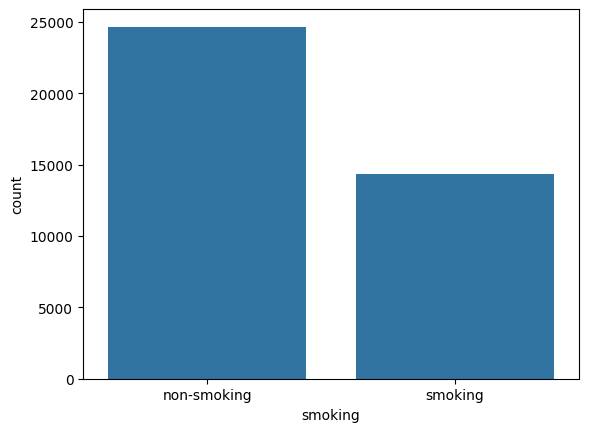

In [5]:
### check class imbalance


ax = sns.countplot(x='smoking', data=(train_df))
ax.set_xticklabels(['non-smoking', 'smoking'])

There is a slight class imbalance.

Since there is enough number of samples to learn from, downsampling of non-smoking population should be a better choice versus upsampling of smoking population. Unlike oversampling or SMOTE, downsapling does not introduce synthetic data, which reduces the chance of overfitting because it might increase the instances of the minority class based on existing ones.

<ipython-input-6-424e21f7fa6f>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['non-smoking', 'smoking'])


[Text(0, 0, 'non-smoking'), Text(1, 0, 'smoking')]

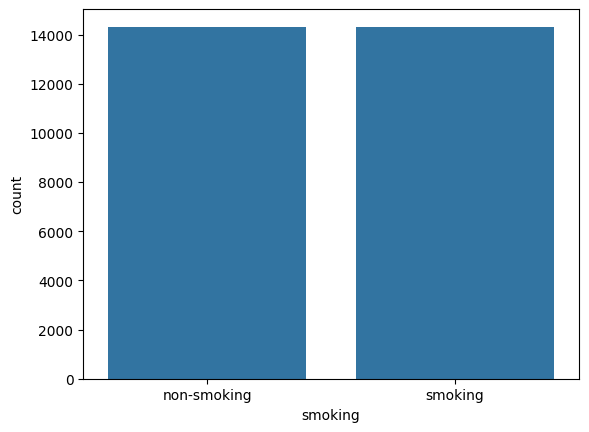

In [6]:
### df1 is the smoking population, df1 is the non-smoking population

df1 = train_df[train_df.smoking == 1]
df0 = train_df[train_df.smoking == 0]

df0_downsampled = df0.sample(n=len(df1), random_state=123)

# Combine minority class with downsampled majority class
downsampled = pd.concat([df0_downsampled, df1])

# Display new class counts
ax = sns.countplot(x='smoking', data=downsampled)
ax.set_xticklabels(['non-smoking', 'smoking'])

In [7]:
### downsampled is our new dataset to be used

train_df = downsampled
train_df.describe()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
count,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,...,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000,28636.000000
mean,43.567014,165.677818,66.951041,82.616388,1.021026,1.017041,1.024480,1.024899,121.708374,76.225590,...,56.533419,114.544559,14.796815,1.088141,0.898488,26.478384,27.973809,43.217000,0.225765,0.500000
std,11.988474,8.955965,12.910885,9.294941,0.482724,0.485011,0.154536,0.155819,13.508359,9.617084,...,14.532550,42.588897,1.527428,0.404512,0.206554,18.201923,31.389025,53.416501,0.418092,0.500009
min,20.000000,130.000000,30.000000,51.000000,0.100000,0.100000,1.000000,1.000000,71.000000,40.000000,...,4.000000,1.000000,5.800000,1.000000,0.100000,6.000000,3.000000,2.000000,0.000000,0.000000
25%,35.000000,160.000000,55.000000,76.000000,0.800000,0.800000,1.000000,1.000000,112.000000,70.000000,...,46.000000,91.000000,13.800000,1.000000,0.800000,19.000000,16.000000,18.000000,0.000000,0.000000
50%,40.000000,165.000000,65.000000,82.000000,1.000000,1.000000,1.000000,1.000000,120.000000,76.000000,...,55.000000,112.000000,15.000000,1.000000,0.900000,23.000000,22.000000,28.000000,0.000000,0.500000
75%,50.000000,170.000000,75.000000,88.800000,1.200000,1.200000,1.000000,1.000000,130.000000,82.000000,...,65.000000,135.000000,15.900000,1.000000,1.000000,29.000000,32.000000,48.000000,0.000000,1.000000
max,85.000000,190.000000,135.000000,129.000000,9.900000,9.900000,2.000000,2.000000,233.000000,146.000000,...,359.000000,1860.000000,21.100000,6.000000,10.000000,981.000000,2914.000000,999.000000,1.000000,1.000000


# Feature selection
keep the important and meaningful feature and remove correlated features

In [8]:
### Some basic research tells me height has the least relationship with smoking
train_df = train_df.drop(['height(cm)'], axis=1)

Checking if there is multicollnearity on the features. If two features are highly correlated, one of them can be dropped to save some computational resource and reduce confounding variable.

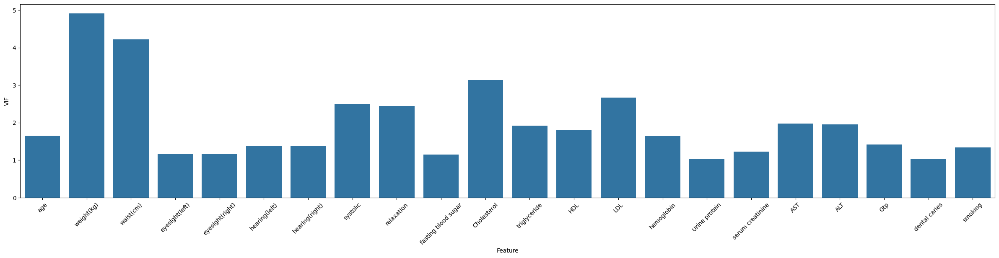

In [9]:
# Using variance inflation factor (VIF) to check multicollinearity, a higher VIF indicates a stronger correlation compared to rest of the features.
# Generally a VIF > 5 is moderate to high in multicollnearity.

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.datasets import make_regression

X_train_vif = train_df.copy()

# Adding a constant column for the intercept
X_train_vif['Intercept'] = 1

# Calculating VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = X_train_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_vif.values, i) for i in range(X_train_vif.shape[1])]

# Removing the intercept row for display
vif_data = vif_data[vif_data["Feature"] != "Intercept"]

plt.figure(figsize=(30, 6))
sns.barplot(x='Feature', y='VIF', data=vif_data)
plt.xticks(rotation=45)
plt.show()

Using pearson correlation together with VIF, one of the correlated features can be dropped

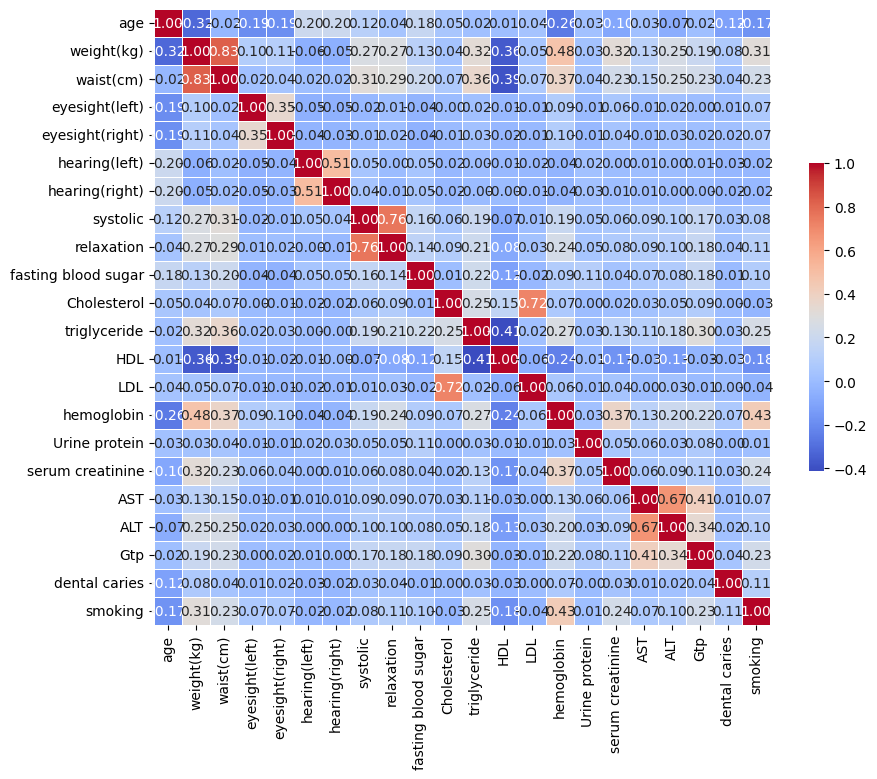

In [11]:
correlation_matrix = train_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

Features that to be dropped
1. weight: weight might be less representative than waist because waist is more indicative of organ fat, which is directly linked to smoking
2. Cholesterol: basically HDL + LDL, LDL, the bad cholesterol might be more direct than just cholesterol
3. AST: ALT is more indicative of liver injury, which is directly linked to smoking
4. One of the hearing: only a mild correlation. Just drop one of the two, the implication of right or left hearing isnt clear.



In [12]:
train_df = train_df.drop(['weight(kg)', 'Cholesterol', 'AST', 'hearing(left)'], axis=1)

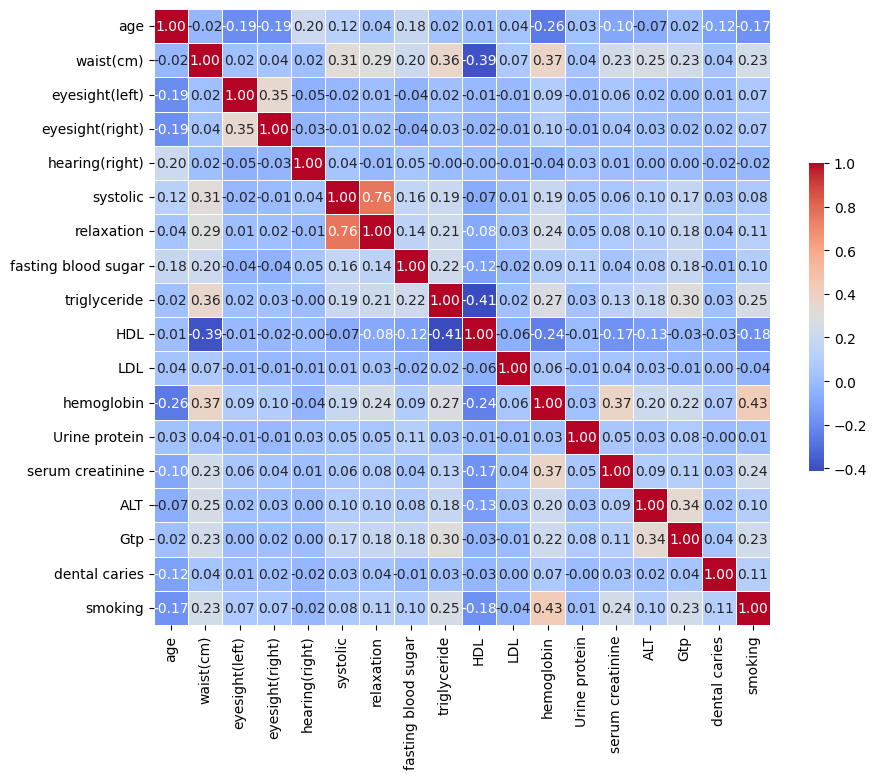

In [13]:
correlation_matrix = train_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

# Supervised
Using Gridsearchcv to exhaustly find the best hyperparameter so you can tweek with other option to improve the model, such as adjusting train test split

Split train data into train data and test data

80% train data, 20% test data



In [14]:
X = train_df.iloc[:,:-1]
y = train_df['smoking']

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=1234, stratify=y)

Supervised learning:

Chosen model:

Logistic regression

Random forest

Decision tree

These model is chosen because the goal is data classification.

In [16]:
# Scale the train data
scaler = StandardScaler()

# fit on standardscaler computes mean and stv for each feature
scaler.fit(X_train)

# Apply transform to both the training set and the test set, so the data is scaled
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

Use GridSearchCv to find the optimal parameters

C is a regularization parameter that controls the trade off between the achieving a low training error and a low testing error that is the ability to generalize your classifier to unseen data





In [ ]:
def find_best_model(X, y):
    models = {
        'logistic_regression': { ### Penalty='elasticnet',both L1 and L2 regularization. Solver='saga', algorithm for big dataset for faster computation. Max_iter, Maximum number of iterations taken for gridsearch to reach best parameters. ###
            'pipe': Pipeline([('scaler', StandardScaler()), ('LR', LogisticRegression(penalty='elasticnet', random_state=1234, solver='saga', max_iter=2000))]),
            'param_grid': [{
                'LR__C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100], ### The inverse of regularization strength for LogisticRegression. Smaller values specify stronger regularization.
                'LR__l1_ratio': [0, 0.2, 0.4, 0.6, 0.8, 1] ### allow the model to explore various combinations of L1 and L2 regularization
            }]
        },
        'decision_tree': {
            'pipe': Pipeline([('scaler', StandardScaler()), ('DT', DecisionTreeClassifier(class_weight='balanced', random_state=1234))]),
            'param_grid': [{
                'DT__criterion': ['gini', 'entropy', 'log_loss'], ### 3 similar formula used to calculate for decision tree spliting
                'DT__max_depth': list(range(5, 16, 2)) ### min, max, step
            }]
        },
        'random_forest': {
            'pipe': Pipeline([('scaler', StandardScaler()), ('RF', RandomForestClassifier(random_state=1234))]),
            'param_grid': [{
                'RF__criterion': ['gini', 'entropy'],
                'RF__max_depth': list(range(5, 16, 2)),  ### how deep is each tree
                'RF__n_estimators': list(range(100, 501, 100)) ### number of bootstrapped dataset
                }]
        },
        'xgb' : {
            'pipe' : Pipeline([('scaler', StandardScaler()), ('XGB', XGBClassifier(random_state=1234))]),
            'param_grid' : [{
                'XGB__learning_rate' : [0.01, 0.05, 0.1, 0.2, 0.3],
                'XGB__max_depth' : list(range(5, 16, 2)),
                'XGB__n_estimators' : list(range(100, 501, 100))
        }]
    }
            }

    scores = []

    for model_name, model_params in models.items():
        gs = GridSearchCV(model_params['pipe'],
                  model_params['param_grid'],
                  scoring=['accuracy', 'roc_auc'],
                  cv=KFold(n_splits=10, shuffle=True, random_state=1234),
                  return_train_score=True,
                  refit='accuracy')

        gs.fit(X, y)
        scores.append({
            'model': model_name,
            'best_parameters': gs.best_params_,
            'score': gs.best_score_
        })

    return pd.DataFrame(scores, columns=['model', 'best_parameters', 'score'])


In [ ]:
best_model_train = find_best_model(X_train, y_train)
# best_model_test = find_best_model(X_test, y_test) ### not really needed but could use it to see the difference

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

print(best_model_train)
# print(best_model_test)


                 model  \
0  logistic_regression   
1        decision_tree   
2        random_forest   
3                  xgb   

                                                               best_parameters  \
0                                          {'LR__C': 0.1, 'LR__l1_ratio': 0.8}   
1                                {'DT__criterion': 'gini', 'DT__max_depth': 9}   
2   {'RF__criterion': 'entropy', 'RF__max_depth': 15, 'RF__n_estimators': 500}   
3  {'XGB__learning_rate': 0.1, 'XGB__max_depth': 15, 'XGB__n_estimators': 200}   

      score  
0  0.720971  
1  0.722280  
2  0.772306  
3  0.772481  


These chosen model gives about 74% accuracy, not ideal or very reliable at predicting but it is obviously better than random guessing of 50% accuracy. The similar score on the train and test data, while being far away from 100% suggest that it is not a case of overfitting

# Evaluation

In [ ]:
# CV score from random forest

from sklearn.model_selection import cross_val_score
scores = cross_val_score(RandomForestClassifier(criterion='entropy', max_depth=15, n_estimators=500, random_state=1234), X_train, y_train, cv=10)
print('10 fold CV avg Accuracy : {}'.format(scores.mean()))

10 fold CV avg Accuracy : 0.7757555616950178


In [ ]:
# CV score from XGB

from sklearn.model_selection import cross_val_score
scores = cross_val_score(XGBClassifier(n_estimators=200, max_depth=15, learning_rate=0.1, random_state=1234), X_train, y_train, cv=5)
print('5 fold CV avg Accuracy : {}'.format(scores.mean()))

5 fold CV avg Accuracy : 0.7656712279507208


In [16]:
### visualize decision trees
from sklearn.tree import plot_tree

tree_model = DecisionTreeClassifier(criterion='gini', max_depth=9, class_weight='balanced', random_state=1234)
tree_model.fit(X_train, y_train)

plt.figure(figsize=(20,10), dpi=1000)
plot_tree(tree_model, feature_names=X.columns, class_names=['0', '1'], filled=True)
plt.show()

In [20]:
### visualize random forest trees

from sklearn.tree import plot_tree

rf_model = RandomForestClassifier(criterion='entropy', max_depth=3, n_estimators=3, random_state=1234)
rf_model.fit(X, y)

plt.figure(figsize=(20,10), dpi=1000)
for i, tree_in_rf in enumerate(rf_model.estimators_):
    plt.subplot(1, len(rf_model.estimators_), i + 1)
    plot_tree(tree_in_rf, feature_names=X.columns, class_names=['0', '1'], filled=True)
    plt.title(f'Tree {i}')

plt.show()

Confusion matrix for these two models

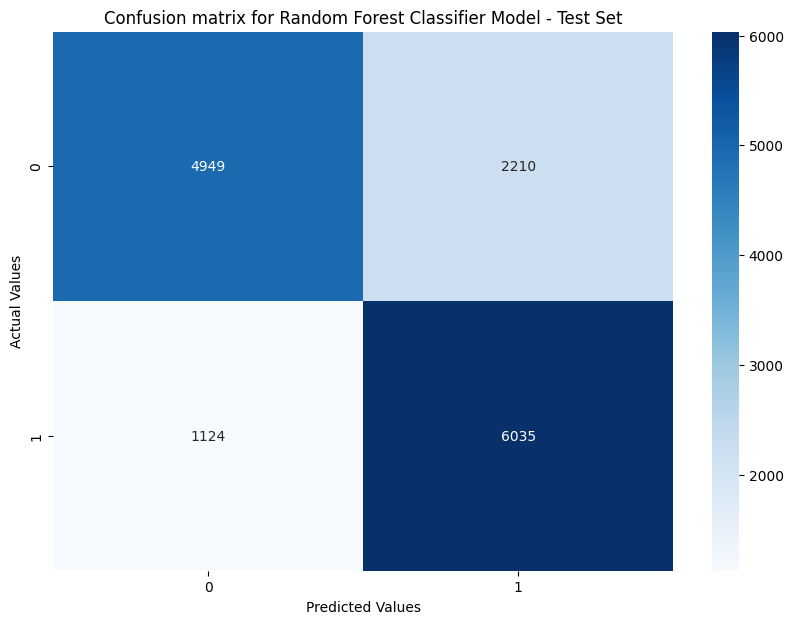

{'0': {'precision': 0.8149184916845051, 'recall': 0.6912976672719654, 'f1-score': 0.7480350665054415, 'support': 7159}, '1': {'precision': 0.7319587628865979, 'recall': 0.8429948316804023, 'f1-score': 0.78356271098416, 'support': 7159}, 'accuracy': 0.7671462494761838, 'macro avg': {'precision': 0.7734386272855516, 'recall': 0.7671462494761838, 'f1-score': 0.7657988887448007, 'support': 14318}, 'weighted avg': {'precision': 0.7734386272855516, 'recall': 0.7671462494761838, 'f1-score': 0.7657988887448007, 'support': 14318}}


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

rf = RandomForestClassifier(n_estimators=300, random_state=1234)
rf.fit(X_train, y_train)


y_pred = rf.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10,7))
p = sns.heatmap(cm, annot=True, cmap="Blues", fmt='g')
plt.title('Confusion matrix for Random Forest Classifier Model - Test Set')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

report = classification_report(y_test, y_pred, output_dict=True)
report_df = pd.DataFrame(report).transpose()
print(report_df)

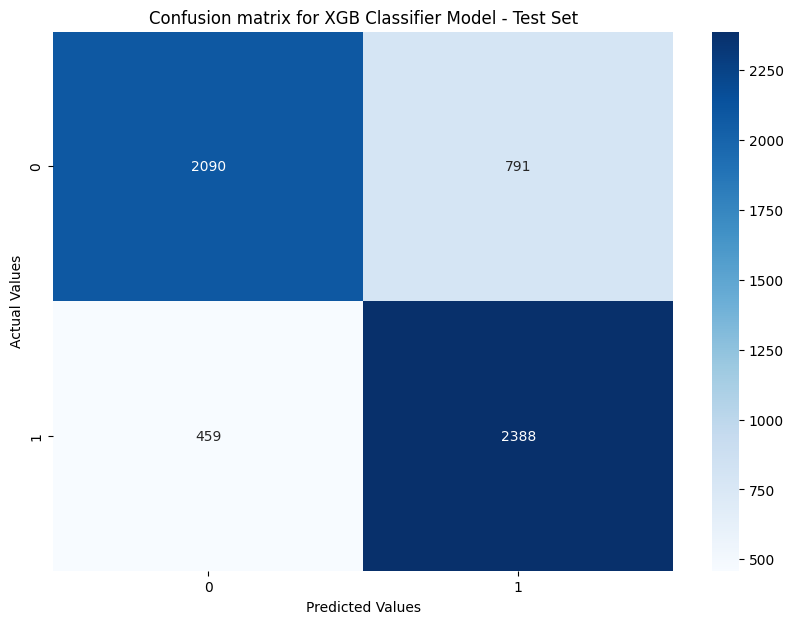

In [ ]:
xgb = XGBClassifier(n_estimators=300, max_depth=15, learning_rate=0.05, random_state=1234)
xgb.fit(X_train, y_train)


y_pred = xgb.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10,7))
p = sns.heatmap(cm, annot=True, cmap="Blues", fmt='g')
plt.title('Confusion matrix for XGB Classifier Model - Test Set')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

In [ ]:
classification_report(y_test, y_pred, output_dict=True)

{'0': {'precision': 0.8353708231458843,
  'recall': 0.7115584866365845,
  'f1-score': 0.7685098406747891,
  'support': 2881},
 '1': {'precision': 0.7461820403176542,
  'recall': 0.8580962416578855,
  'f1-score': 0.798235582421173,
  'support': 2847},
 'accuracy': 0.7843924581005587,
 'macro avg': {'precision': 0.7907764317317693,
  'recall': 0.784827364147235,
  'f1-score': 0.783372711547981,
  'support': 5728},
 'weighted avg': {'precision': 0.7910411330774537,
  'recall': 0.7843924581005587,
  'f1-score': 0.7832844891999209,
  'support': 5728}}

# Semi-supervised learning

PCA -> Random forest

In [ ]:
from sklearn.decomposition import PCA

pca_xgb = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=0.9, random_state=1234)),
    ('xgb', XGBClassifier(n_estimators=200, max_depth=15, learning_rate=0.1, random_state=1234))
])

pca_xgb.fit(X_train, y_train)

print('Train Accuracy score: {}'.format(pca_xgb.score(X_train, y_train)))
print('Test Accuracy score: {}'.format(pca_xgb.score(X_test, y_test)))


### Overfitting, reason unclear, eigenvalue vector might not work well with tree models

Train Accuracy score: 1.0
Test Accuracy score: 0.7693925713113072


In [ ]:
from sklearn.decomposition import PCA

pca_rf = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=0.9, random_state=1234)),
    ('rf', RandomForestClassifier(criterion='entropy', max_depth=15, n_estimators=500, random_state=1234))
])

pca_rf.fit(X_train, y_train)

print('Train Accuracy score: {}'.format(pca_rf.score(X_train, y_train)))
print('Test Accuracy score: {}'.format(pca_rf.score(X_test, y_test)))

See the transformed feature matrix from PCA

In [ ]:
from sklearn.decomposition import PCA

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

print("Transformed Feature Matrix:\n", pd.DataFrame(X_pca))
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

principal_df = pd.DataFrame(data = X_pca, columns = ['Principal Component 1', 'Principal Component 2'])

plt.figure(figsize=(8, 6))
plt.scatter(principal_df['Principal Component 1'], principal_df['Principal Component 2'])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Dataset')
plt.grid(True)
plt.show()

In [ ]:
pca = PCA(n_components=0.9)
pca.fit(X)

components = pca.components_
for i, component in enumerate(components):
    print(f"Principal Component {i+1}:")
    feature_contributions = pd.Series(component, index=X.columns).sort_values(key=abs, ascending=False)
    print(feature_contributions)
    print(len(feature_contributions))

Delete one more correlated feature to see the if there is an improvement on score

In [ ]:
from sklearn.decomposition import PCA

train_df = train_df.drop(['relaxation'], axis=1) ### Comment or uncomment depending on steps
X = train_df.iloc[:,:-1]
y = train_df['smoking']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1234, stratify=y)

pca_rf = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=0.9, random_state=1234)),
    ('rf', RandomForestClassifier(criterion='entropy', max_depth=15, n_estimators=500, random_state=1234))
])

pca_rf.fit(X_train, y_train)

print('Train Accuracy score: {}'.format(pca_rf.score(X_train, y_train)))
print('Test Accuracy score: {}'.format(pca_rf.score(X_test, y_test)))

Train Accuracy score: 0.9686087151697823
Test Accuracy score: 0.7808131332563807


# Unsupervised

Random Forest Feature ranking

In [ ]:
# random forest feature ranking
# import fresh dataset again

train_df = pd.read_csv('/content/train_dataset.csv')
X = train_df.iloc[:,:-1]
y = train_df['smoking']


rf = RandomForestClassifier(n_estimators=300, random_state=1234)
rf.fit(X, y)

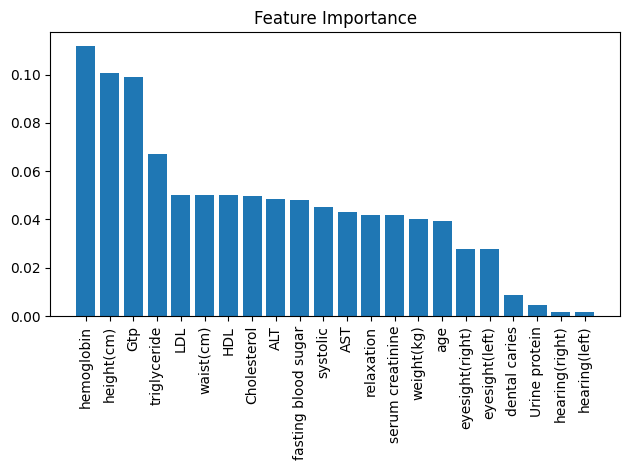

In [ ]:
importances = rf.feature_importances_

sorted_indices = np.argsort(importances)[::-1]

plt.title('Feature Importance')
plt.bar(range(X.shape[1]), importances[sorted_indices], align='center')
plt.xticks(range(X.shape[1]), X.columns[sorted_indices], rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
X = train_df.loc[:, ['hemoglobin', 'Gtp', 'height(cm)']]
y = train_df['smoking']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1234, stratify=y)

In [ ]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(RandomForestClassifier(criterion='entropy', max_depth=15, n_estimators=500, random_state=1234), X_train, y_train, cv=5)
print('5 fold CV avg Accuracy : {}'.format(scores.mean()))

### Not an improvement

5 fold CV avg Accuracy : 0.7276107590097116


By only selecting the top 3 important features, the previous best performing model returns a lower score, which may suggest a case of underfitting because there probably isnt enough feature to build enough trees.

Conclusion
These models achieved very similar performance. Perhaps either smoking or not is not a very good indicator of smoking statues. On top of that, the casual relationship is not clear: is a high blood glucose level result in smoking, or is smoking a result of high blood glucose? Instead of yes or no, years of smoking could be a better indicator.